## **2. Visualization and EDA**

In [23]:
# Import pandas as pd
import pandas as pd

In [24]:
# Load the dataframe
df = pd.read_csv('clean_df.csv')

In [25]:
!pip install plotly
import plotly.express as px
# Scatter plot for Price vs Days on Market
fig = px.scatter(df,
                 x='days_on_market',  # X-axis: Days on Market
                 y='price',           # Y-axis: Price
                 hover_name='listing_heading',  # Information to show on hover
                 hover_data=['dealer_name', 'dealer_city', 'dealer_province'],  # Additional info on hover
                 title="Price vs Days on Market of Listings",
                 labels={'days_on_market': 'Days on Market', 'price': 'Price (in $)'})

# Display the scatter plot
fig.show()


In [26]:
import plotly.graph_objects as go

# Assuming df contains the data
# Generate the base pie chart data
pie_chart_data = df['make'].value_counts(normalize=True).reset_index()
pie_chart_data.columns = ['make', 'percentage']
pie_chart_data['percentage'] *= 100  # Convert proportions to percentages

# Store a copy of the original data before filtering
original_pie_chart_data = pie_chart_data.copy()

# Filter out makes with less than 3% and group them under 'Other'
other_makes = original_pie_chart_data[original_pie_chart_data['percentage'] < 3]['make'].tolist()
other_percentages = original_pie_chart_data[original_pie_chart_data['percentage'] < 3]['percentage'].tolist()
other_percentage = sum(other_percentages)

pie_chart_data = pie_chart_data[pie_chart_data['percentage'] >= 3]
pie_chart_data = pd.concat([pie_chart_data, pd.DataFrame([{'make': 'Other', 'percentage': other_percentage}])], ignore_index=True)


In [27]:
# Prepare hierarchical data for the Sunburst chart
labels = pie_chart_data['make'].tolist() + other_makes
parents = [''] * len(pie_chart_data) + ['Other'] * len(other_makes)
values = pie_chart_data['percentage'].tolist() + other_percentages

# Create Sunburst chart
fig = go.Figure(go.Sunburst(
    labels=labels,
    parents=parents,
    values=values,
    branchvalues="total",
    textinfo="label+percent parent"
))

# Update layout for better display
fig.update_layout(
    title="Interactive Distribution of Car Makes (Percentage Proportions)",
    margin=dict(t=50, l=0, r=0, b=0)
)

fig.show()

In [28]:
#  Calculate the frequency of each 'make' and find the most and least popular makes
make_counts = df['make'].value_counts()

# Find the most popular (first) and least popular (last) makes
most_popular_make = make_counts.idxmax()
least_popular_make = make_counts.idxmin()

# Step 3: Filter the DataFrame to include only the rows for the most and least popular makes
df_filtered = df[df['make'].isin([most_popular_make, least_popular_make])]

# Step 4: Create the histogram for 'mileage' column for most and least popular makes
fig = px.histogram(df_filtered,
                   x='mileage',  # Variable for the x-axis (Mileage)
                   nbins=30,      # Number of bins in the histogram
                   title="Distribution of Car Mileage (Most and Least Popular Makes)",
                   labels={'mileage': 'Mileage (in km)'},
                   color='make',  # Color by 'make' to differentiate between the two
                   template='plotly_dark')

# Step 5: Show the histogram
fig.show()



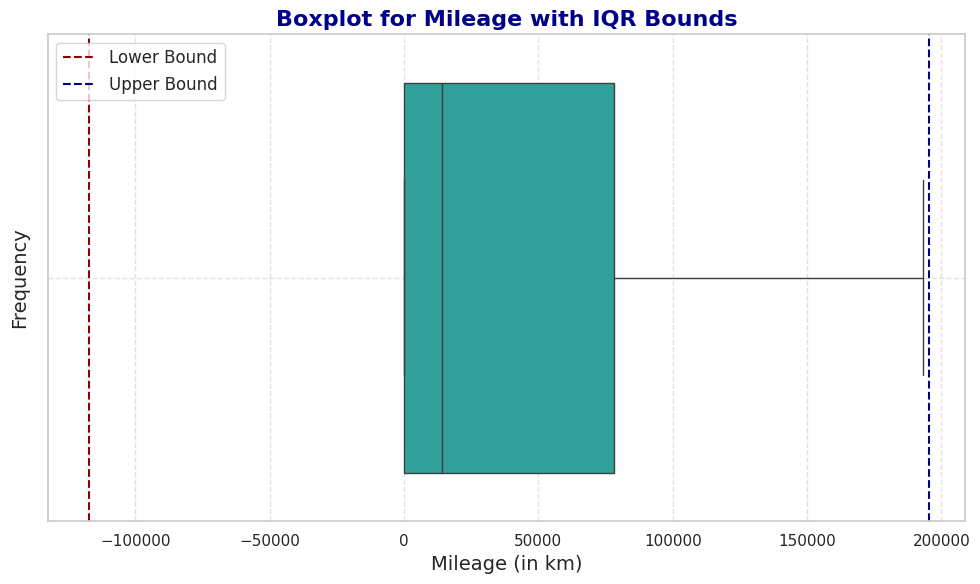

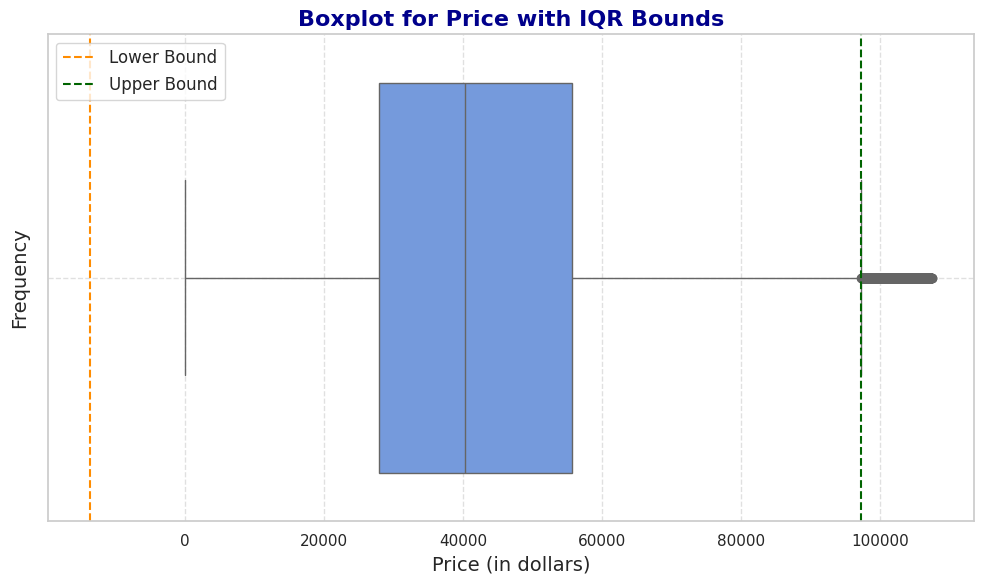

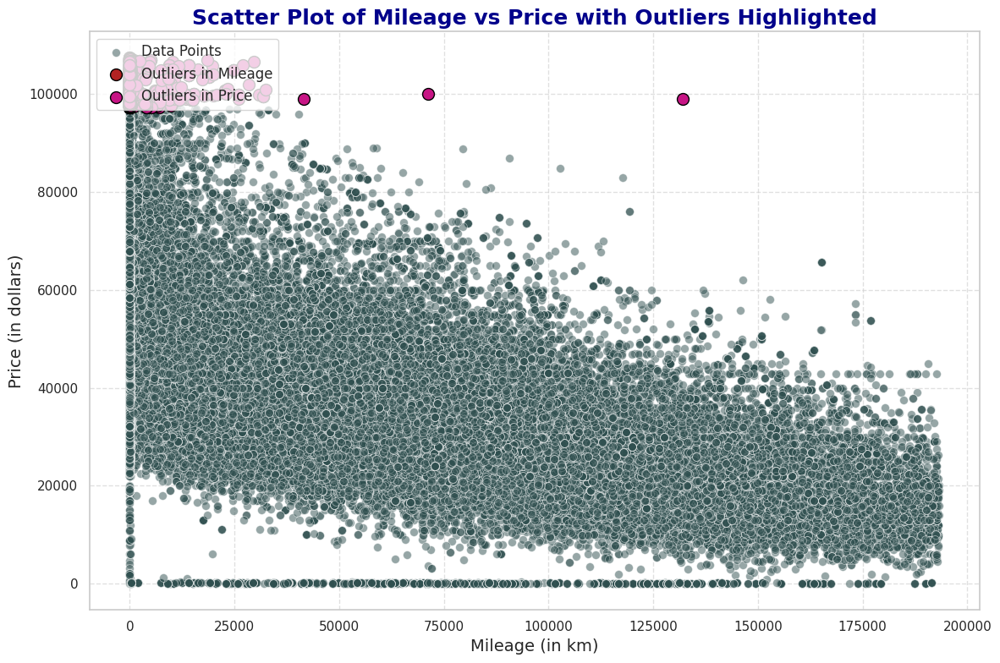

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is your original DataFrame with 'mileage' and 'price' columns

# Calculate IQR and identify outliers for 'mileage'
Q1_mileage = df['mileage'].quantile(0.25)
Q3_mileage = df['mileage'].quantile(0.75)
IQR_mileage = Q3_mileage - Q1_mileage
lb1 = Q1_mileage - 1.5 * IQR_mileage
ub1 = Q3_mileage + 1.5 * IQR_mileage
outliers_feature1 = df[(df['mileage'] < lb1) | (df['mileage'] > ub1)]

# Calculate IQR and identify outliers for 'price'
Q1_price = df['price'].quantile(0.25)
Q3_price = df['price'].quantile(0.75)
IQR_price = Q3_price - Q1_price
lb2 = Q1_price - 1.5 * IQR_price
ub2 = Q3_price + 1.5 * IQR_price
outliers_feature2 = df[(df['price'] < lb2) | (df['price'] > ub2)]

# Create a new DataFrame 'df_simple_outliers' containing only the relevant columns
df_simple_outliers = df[['mileage', 'price']].copy()

# Set Seaborn style for better visuals
sns.set(style="whitegrid")

# Boxplot for 'mileage' with IQR bounds
plt.figure(figsize=(10, 6))
sns.boxplot(x=df_simple_outliers['mileage'], color='lightseagreen')
plt.axvline(lb1, color='darkred', linestyle='--', label='Lower Bound')
plt.axvline(ub1, color='darkblue', linestyle='--', label='Upper Bound')
plt.title('Boxplot for Mileage with IQR Bounds', fontsize=16, fontweight='bold', color='darkblue')
plt.xlabel('Mileage (in km)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.legend(loc='upper left', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# Boxplot for 'price' with IQR bounds
plt.figure(figsize=(10, 6))
sns.boxplot(x=df_simple_outliers['price'], color='cornflowerblue')
plt.axvline(lb2, color='darkorange', linestyle='--', label='Lower Bound')
plt.axvline(ub2, color='darkgreen', linestyle='--', label='Upper Bound')
plt.title('Boxplot for Price with IQR Bounds', fontsize=16, fontweight='bold', color='darkblue')
plt.xlabel('Price (in dollars)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.legend(loc='upper left', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# Scatter plot of 'mileage' vs 'price' with outliers highlighted
plt.figure(figsize=(12, 8))
sns.scatterplot(data=df_simple_outliers, x='mileage', y='price', color='darkslategray', alpha=0.5, s=50, label='Data Points')

# Highlight outliers with different colors
plt.scatter(outliers_feature1['mileage'], outliers_feature1['price'], color='firebrick', label='Outliers in Mileage', s=100, edgecolor='black', marker='o')
plt.scatter(outliers_feature2['mileage'], outliers_feature2['price'], color='mediumvioletred', label='Outliers in Price', s=100, edgecolor='black', marker='o')

# Add titles, axis labels, and grid
plt.title('Scatter Plot of Mileage vs Price with Outliers Highlighted', fontsize=18, fontweight='bold', color='darkblue')
plt.xlabel('Mileage (in km)', fontsize=14)
plt.ylabel('Price (in dollars)', fontsize=14)
plt.legend(loc='upper left', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [30]:
#plot a histrogram of dealer_city
import plotly.express as px

fig = px.histogram(df, x="dealer_city", y="price",
                   histfunc="sum",  # Use 'sum' to aggregate total price for each city
                   title="Total Price Distribution by Dealer City",
                   labels={"price": "Total Price", "dealer_city": "Dealer City"},
                   color_discrete_sequence=['darkgreen'])
fig.show()

In [31]:
import plotly.express as px
import plotly.graph_objects as go

# Step 1: Find the top 10 most sold car makes
top_10_makes = df['make'].value_counts().nlargest(10).index

# Step 2: Filter the DataFrame to include only the top 10 makes
filtered_df = df[df['make'].isin(top_10_makes)]

# Step 3: Group data by city and make, then count occurrences
city_make_counts = filtered_df.groupby(['dealer_city', 'make'])['make'].count().reset_index(name='count')

# Step 4: Create the histogram
fig_histogram = px.histogram(city_make_counts,
                             x='dealer_city',
                             y='count',
                             color='make',
                             title="Sales Distribution of Top 10 Car Makes Across Cities",
                             labels={'dealer_city': 'City', 'count': 'Number of Car Models Sold'},
                             template='plotly_dark',
                             color_discrete_sequence=px.colors.qualitative.Set3)

fig_histogram.update_layout(barmode='stack')
fig_histogram.show()

# Step 5: Create the bar chart for total counts
total_counts = filtered_df['make'].value_counts().reset_index()
total_counts.columns = ['make', 'total_count']

fig_bar = px.bar(total_counts,
                  x='make',
                  y='total_count',
                  title="Total Sales of Top 10 Car Makes",
                  labels={'make': 'Car Make', 'total_count': 'Total Sales'},
                  template='plotly_dark',
                  color_discrete_sequence=px.colors.qualitative.Set3)

fig_bar.show()


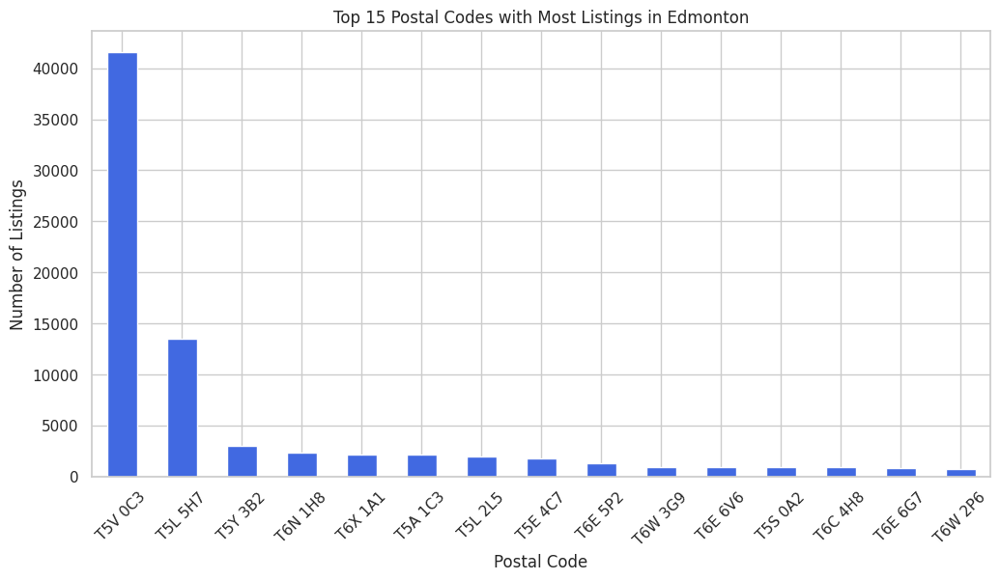

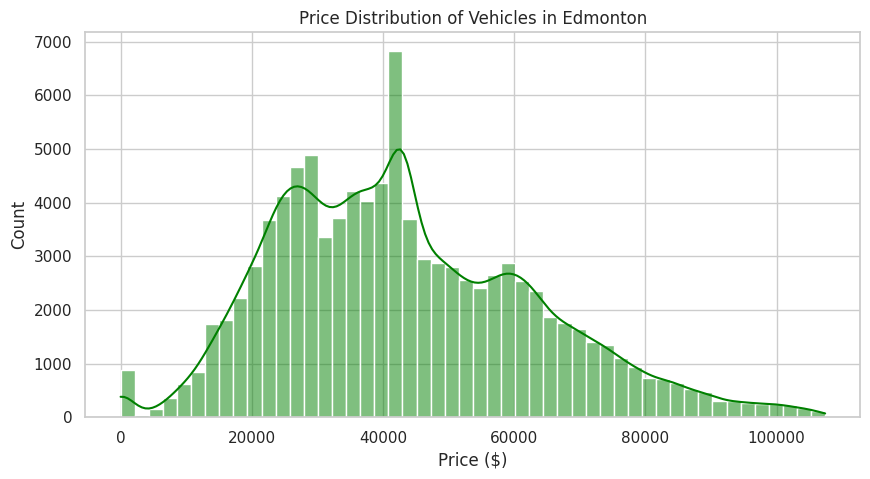

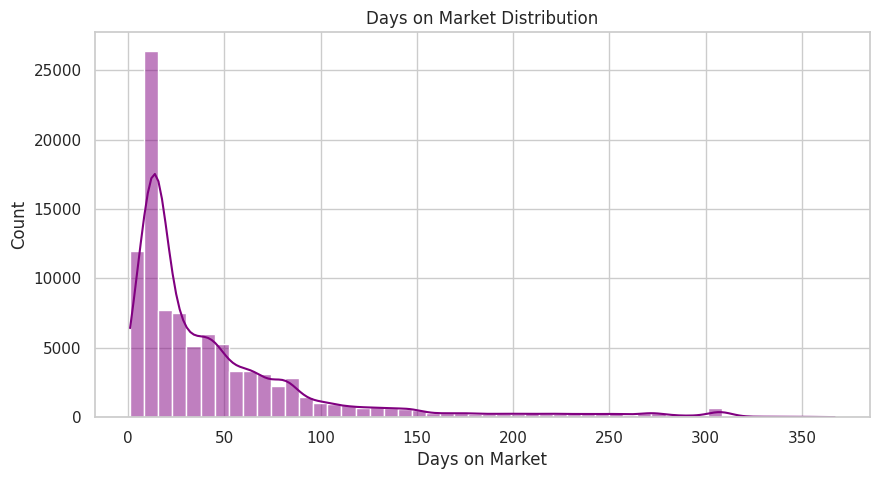

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set style
sns.set(style="whitegrid")

# Create a subset DataFrame for Edmonton listings
df_edmonton = df[df['dealer_city'] == 'Edmonton']  # Filter for Edmonton

# Plot 1: Vehicle count by postal code
plt.figure(figsize=(12, 6))
df_edmonton["dealer_postal_code"].value_counts().head(15).plot(kind="bar", color="royalblue")
plt.title("Top 15 Postal Codes with Most Listings in Edmonton")
plt.xlabel("Postal Code")
plt.ylabel("Number of Listings")
plt.xticks(rotation=45)
plt.show()

# Plot 2: Price distribution
plt.figure(figsize=(10, 5))
sns.histplot(df_edmonton["price"], bins=50, kde=True, color="green")
plt.title("Price Distribution of Vehicles in Edmonton")
plt.xlabel("Price ($)")
plt.ylabel("Count")
plt.show()

# Plot 3: Days on Market distribution
plt.figure(figsize=(10, 5))
sns.histplot(df_edmonton["days_on_market"], bins=50, kde=True, color="purple")
plt.title("Days on Market Distribution")
plt.xlabel("Days on Market")
plt.ylabel("Count")
plt.show()

/tmp/ipython-input-290658414.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




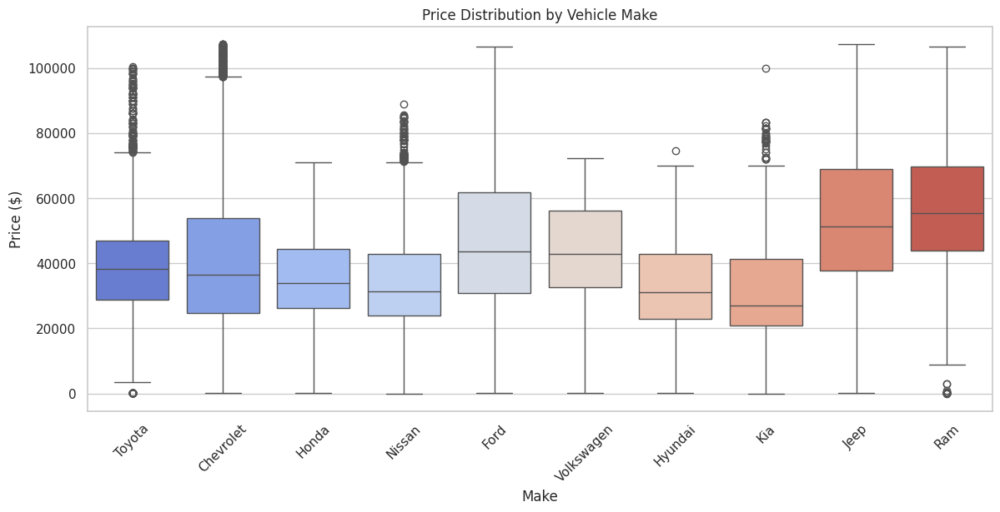

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



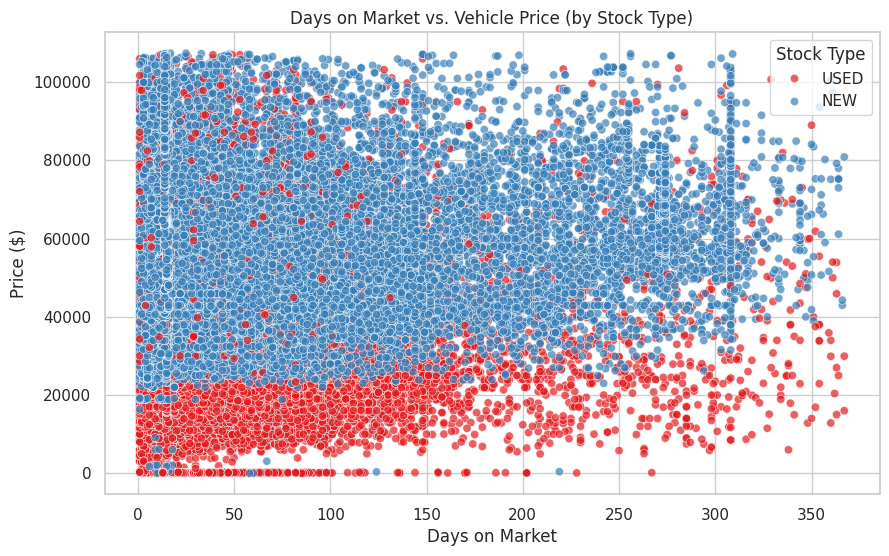

/tmp/ipython-input-290658414.py:29: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




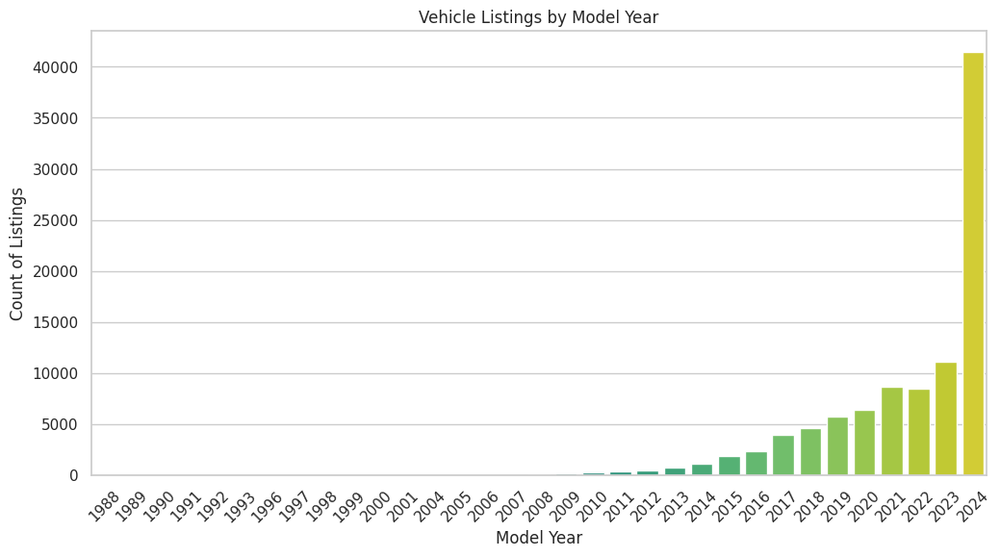

In [33]:
# 1. Box Plot: Price distribution by Make
plt.figure(figsize=(14, 6))
top_makes = df_edmonton["make"].value_counts().head(10).index  # Select top 10 makes
sns.boxplot(data=df_edmonton[df_edmonton["make"].isin(top_makes)], x="make", y="price", palette="coolwarm")
plt.title("Price Distribution by Vehicle Make")
plt.xlabel("Make")
plt.ylabel("Price ($)")
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df_edmonton,
    x="days_on_market",
    y="price",
    hue="stock_type",  # Differentiate by stock type
    palette="Set1",    # Use distinct colors
    alpha=0.7
)
plt.title("Days on Market vs. Vehicle Price (by Stock Type)")
plt.xlabel("Days on Market")
plt.ylabel("Price ($)")
plt.legend(title="Stock Type")
plt.show()


# 3. Count Plot: Number of Listings by Model Year
plt.figure(figsize=(12, 6))
sns.countplot(data=df_edmonton, x="model_year", palette="viridis", order=sorted(df_edmonton["model_year"].unique()))
plt.title("Vehicle Listings by Model Year")
plt.xlabel("Model Year")
plt.ylabel("Count of Listings")
plt.xticks(rotation=45)
plt.show()


Heatmap: Correlation Between Numeric Features
( Shows relationships between key numeric features like price, mileage, and days on market.)

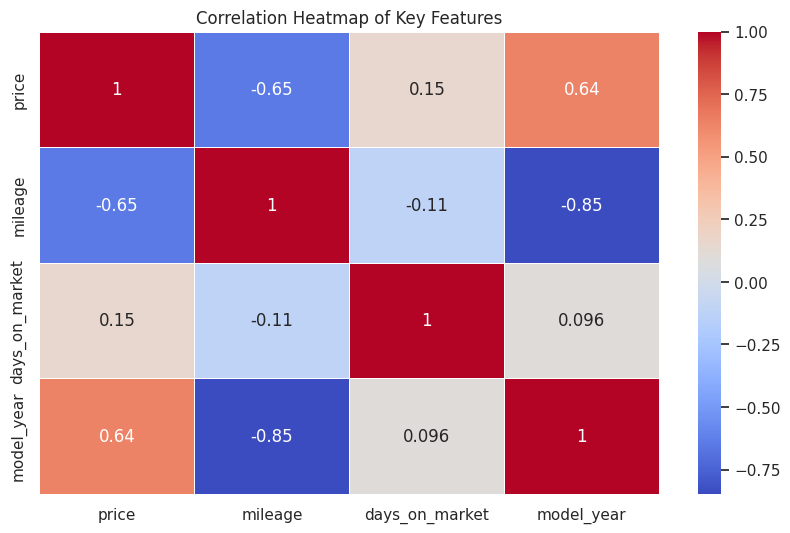

In [34]:
plt.figure(figsize=(10, 6))
sns.heatmap(df_edmonton[["price", "mileage", "days_on_market", "model_year"]].corr(), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Heatmap of Key Features")
plt.show()


Bar Chart: Average Price per Stock Type (New vs. Used)
show pricing differences between new and used cars.

/tmp/ipython-input-983198454.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




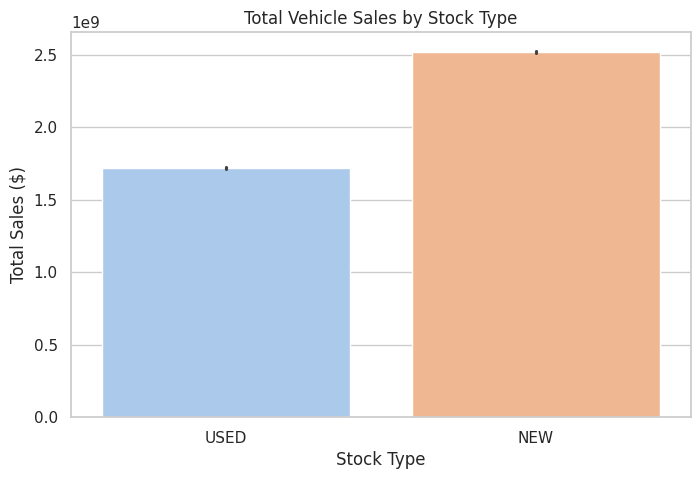

In [35]:
plt.figure(figsize=(8, 5))
sns.barplot(data=df_edmonton, x="stock_type", y="price", estimator=sum, palette="pastel")
plt.title("Total Vehicle Sales by Stock Type")
plt.xlabel("Stock Type")
plt.ylabel("Total Sales ($)")
plt.show()


KDE Plot: Mileage Distribution for Best-Selling Postal Codes:analyze the average mileage of cars sold in top-performing regions.

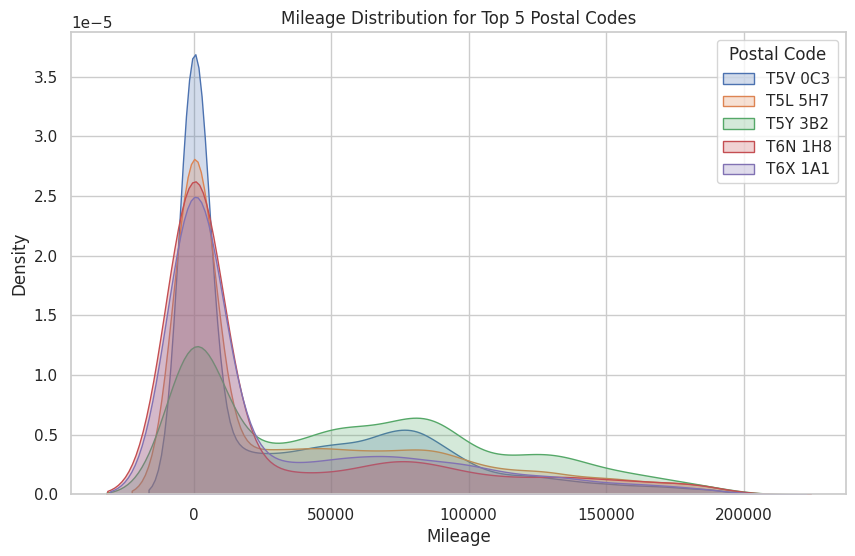

In [36]:
plt.figure(figsize=(10, 6))
top_postal_codes = df_edmonton["dealer_postal_code"].value_counts().head(5).index
for code in top_postal_codes:
    sns.kdeplot(df_edmonton[df_edmonton["dealer_postal_code"] == code]["mileage"], label=code, fill=True)
plt.title("Mileage Distribution for Top 5 Postal Codes")
plt.xlabel("Mileage")
plt.ylabel("Density")
plt.legend(title="Postal Code")
plt.show()


Pair Plot: Price vs. Mileage, Model Year, Days on Market

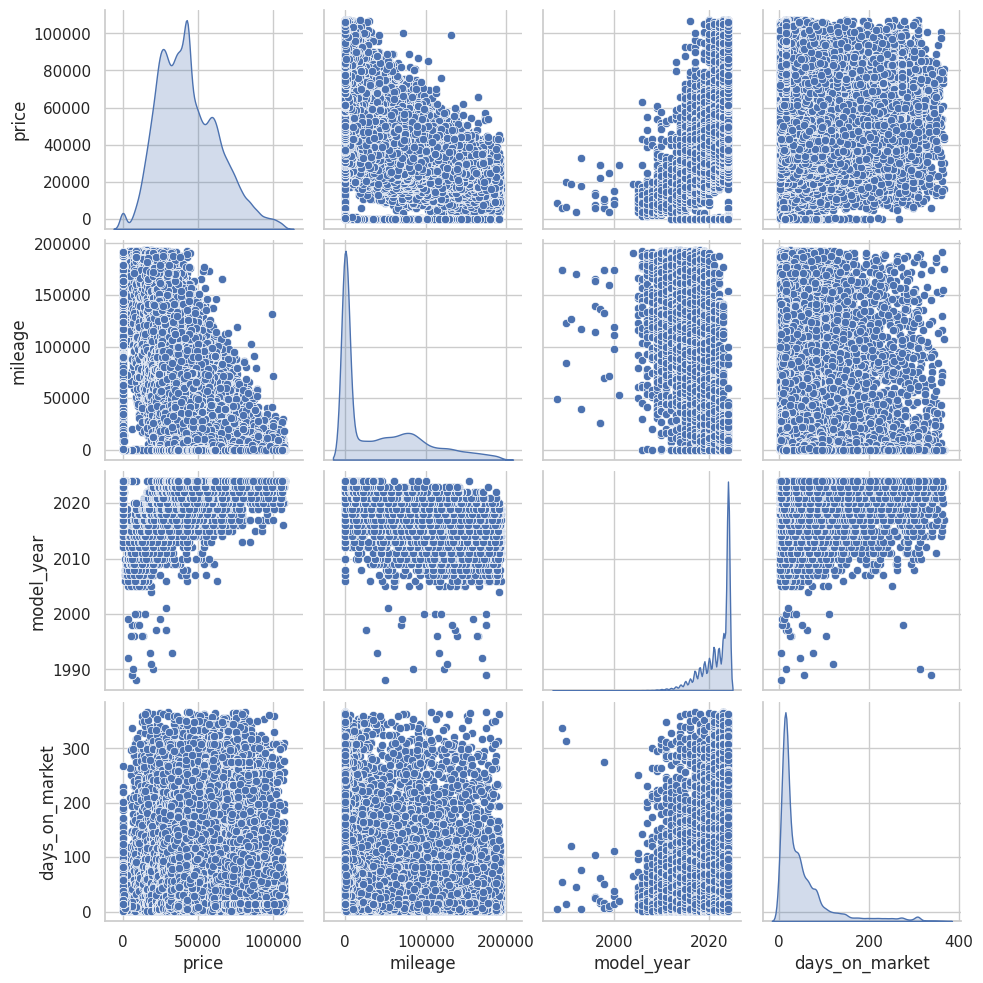

In [37]:
sns.pairplot(df_edmonton[["price", "mileage", "model_year", "days_on_market"]], diag_kind="kde")
plt.show()


In [38]:
# Check if columns exist before applying get_dummies
columns_to_encode = ['make', 'model', 'dealer_postal_code']
columns_to_encode = [col for col in columns_to_encode if col in df.columns]

# Only apply get_dummies if there are columns to encode
if columns_to_encode:
    df = pd.get_dummies(df, columns=columns_to_encode, drop_first=True)

# Label Encoding for 'condition' (if applicable)
if 'condition' in df.columns:
    le = LabelEncoder()
    df['condition'] = le.fit_transform(df['condition'])

# Check the transformed dataset
print(df.head())

# Save the encoded dataset
df.to_csv('encoded_dataset.csv', index=False)

                             listing_id  \
0  a9f565e6-4712-11ef-a23f-79dc25c5e601   
1  03d18c58-253a-11ef-8f33-8905b4a2f000   
2  2d12630b-460e-11ee-89c4-e5b3161d4741   
3  4e9e38f4-2927-11ef-b663-8f640adf7e4f   
4  60d309fb-58f1-11ee-a71d-d56f38d3c5a9   

                                     listing_heading listing_type  \
0                                                NaN         Sold   
1                    1989 Cadillac DeVille Sedan FWD       Active   
2                    1989 Cadillac DeVille Sedan FWD       Active   
3  1990 Dodge D150 | 318 ENGINE UPGRADED TO 340 C...       Active   
4                              1990 Mazda MX-5 Miata       Active   

                                         listing_url listing_first_date  \
0  https://www.redlinemotors.ca/vehicle-details/1...         2024-07-20   
1  https://www.sweetheartmotor.com/cars/used/1989...         2024-06-07   
2  https://www.sweetheartmotor.com/cars/used/1989...         2023-08-28   
3  https://www.stalbertdod

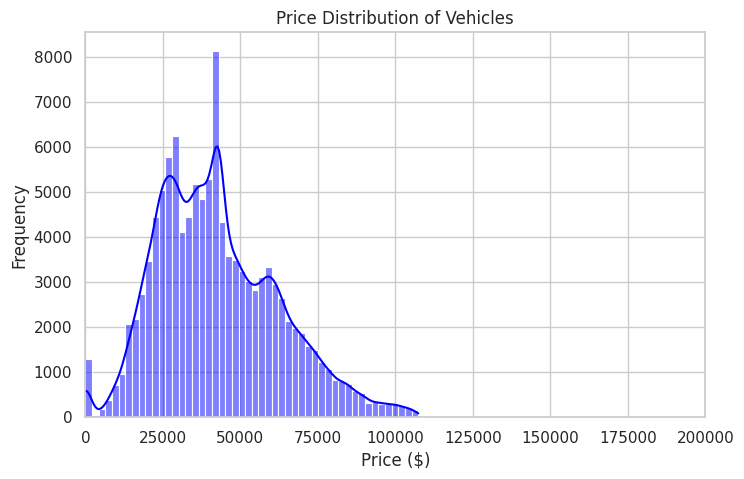

In [39]:
plt.figure(figsize=(8, 5))
sns.histplot(df['price'], bins=50, kde=True, color='blue')
plt.title("Price Distribution of Vehicles")
plt.xlabel("Price ($)")
plt.ylabel("Frequency")
plt.xlim(0, 200000)  # Focus on relevant price range
plt.show()


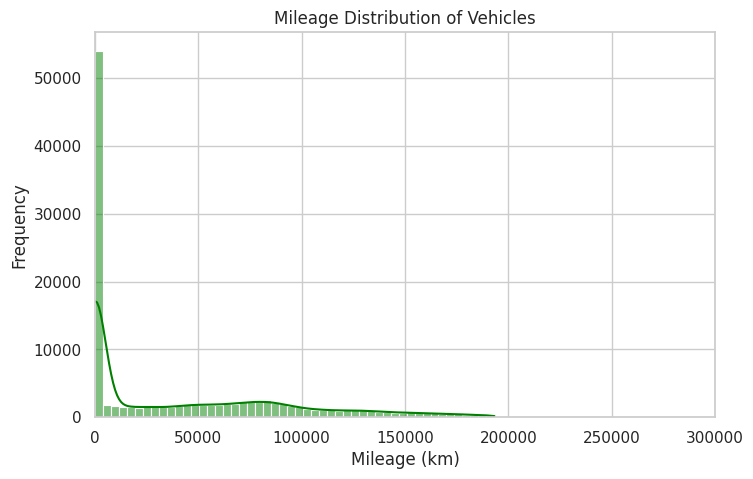

In [40]:
plt.figure(figsize=(8, 5))
sns.histplot(df['mileage'], bins=50, kde=True, color='green')
plt.title("Mileage Distribution of Vehicles")
plt.xlabel("Mileage (km)")
plt.ylabel("Frequency")
plt.xlim(0, 300000)  # Exclude extreme outliers
plt.show()


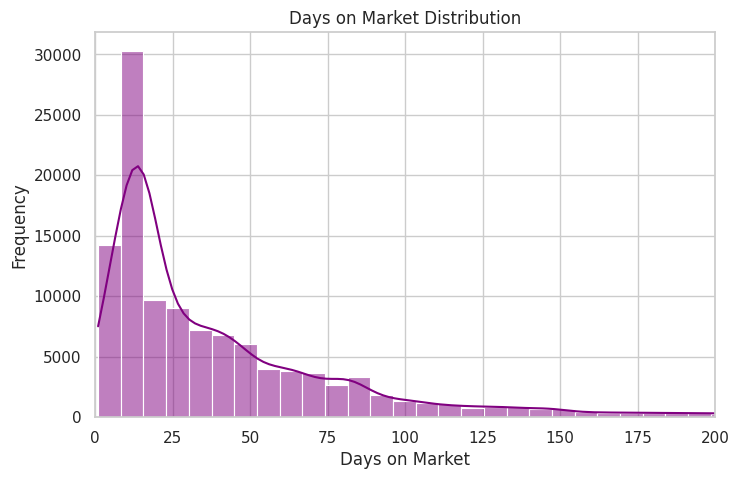

In [41]:
plt.figure(figsize=(8, 5))
sns.histplot(df['days_on_market'], bins=50, kde=True, color='purple')
plt.title("Days on Market Distribution")
plt.xlabel("Days on Market")
plt.ylabel("Frequency")
plt.xlim(0, 200)  # Exclude extreme cases
plt.show()


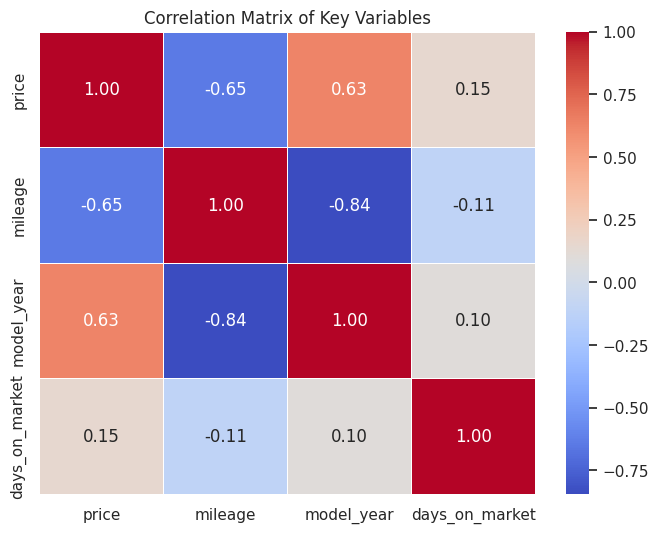

In [42]:
plt.figure(figsize=(8, 6))
corr = df[['price', 'mileage', 'model_year', 'days_on_market']].corr()
sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix of Key Variables")
plt.show()


/tmp/ipython-input-378690630.py:13: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




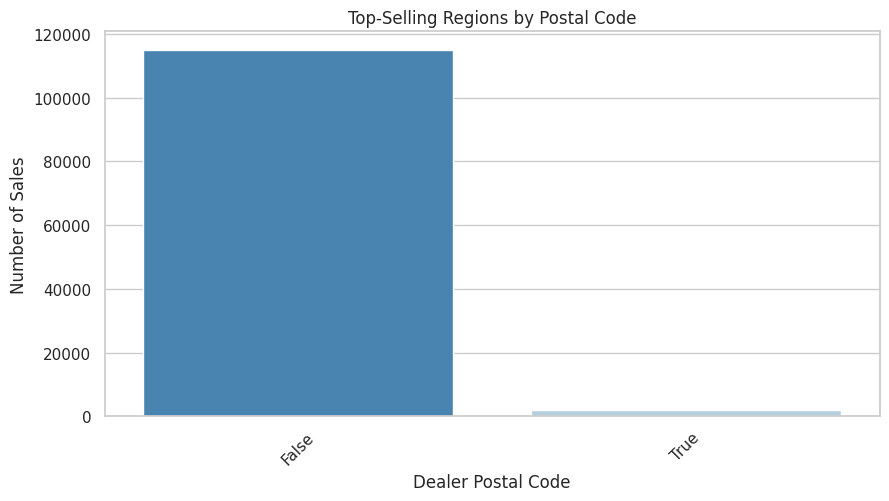

In [43]:
# Identify correct postal code column
postal_code_col = None
for col in df.columns:
    if "dealer_postal_code" in col:
        postal_code_col = col
        break

if postal_code_col:
    # Count vehicle sales by postal code
    top_regions = df[postal_code_col].value_counts().head(10)

    plt.figure(figsize=(10, 5))
    sns.barplot(x=top_regions.index, y=top_regions.values, palette="Blues_r")
    plt.xticks(rotation=45)
    plt.title("Top-Selling Regions by Postal Code")
    plt.xlabel("Dealer Postal Code")
    plt.ylabel("Number of Sales")
    plt.show()
else:
    print("Error: Postal code column not found in dataset.")
